RAGA INDENTIFICATION

Display signals of one the files
and sound of it

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline

In [8]:
filename = 'asavari27.wav'

In [12]:
import IPython.display as ipd
import librosa
import librosa.display

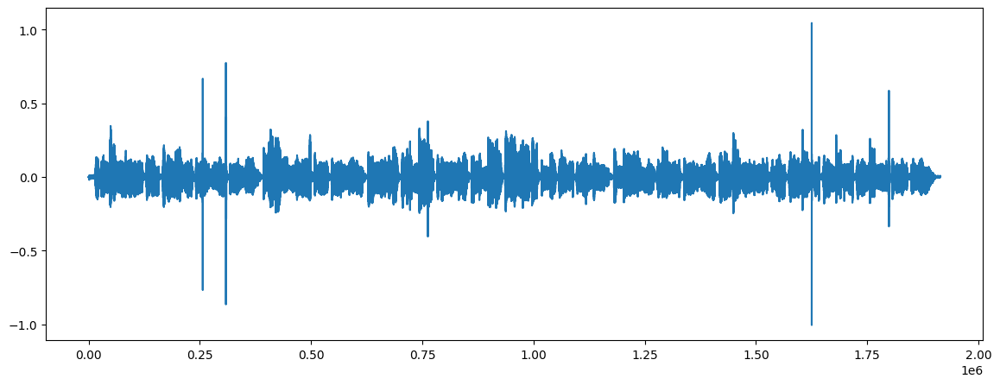

In [21]:
plt.figure(figsize = (14,5))

data,sample_rate = librosa.load(filename)
#librosa.display.waveplot(data,sr = sample_rate)
#not in this version

#alternative
plt.plot(data)
plt.show()

ipd.Audio(filename) 
#function that will help to load the audio in form of wav file

In [22]:
sample_rate
#what is this sample_rate?
#defines how many times per second a sound is sampled.
#by default when we use librosa we read with the sample rate of 22050
#librosa normalises the Dataset to sample rate 22050

22050

In [24]:
#using scipy
from scipy.io import wavfile as wav
wav_sample_rate, wave_audio = wav.read(filename)

In [28]:
wav_sample_rate #actual sample rate

44100

In [30]:
wave_audio
#values of wave signals

array([-0.00360455, -0.00400391, -0.0024166 , ...,  0.00312189,
        0.00281612,  0.00275257], dtype=float32)

In [31]:
data #normalised in (-1,1)
#why librosa ?
#it tries to converge the signal
#it can represent an audio signal with respect to an normalized pattern so a regular pattern can be seen
#it converts the sample_rate to 22050

array([-0.00360455, -0.00400391, -0.0024166 , ...,  0.00312189,
        0.00281612,  0.00275257], dtype=float32)

Data Preprocessing 

Extract features 
Here we will be using MFCC from audio samples.
The MFCC summarises the frequency distribution across the window size ,so it is possible to analysize both the frequency and time characteristics of the sound.These audio representations will allow us to identify features for classification. 

In [40]:
mfccs = librosa.feature.mfcc(y = data, sr=sample_rate,n_mfcc=40)
print(mfccs.shape)

(40, 3741)


In [41]:
mfccs #unique for each file

array([[-4.8409677e+02, -4.5380475e+02, -4.0554068e+02, ...,
        -4.5755704e+02, -4.5745361e+02, -4.8703018e+02],
       [ 6.6176414e+01,  6.0208389e+01,  5.5335190e+01, ...,
         5.8494728e+01,  5.8773109e+01,  6.0322357e+01],
       [ 1.4554167e+01,  3.6064320e+00, -2.9512814e+01, ...,
         9.1385050e+00,  5.4116039e+00,  6.1665788e+00],
       ...,
       [ 8.5449755e-02,  2.3679826e+00,  1.4951041e+00, ...,
         6.8403506e-01,  4.7704673e+00,  1.3371503e-01],
       [ 1.9001669e+00,  1.8160813e+00, -1.3245704e+00, ...,
        -8.3737153e-01,  2.8439419e+00,  1.3626461e+00],
       [ 1.4395223e+00, -6.7408431e-01,  1.6749811e+00, ...,
        -1.3608911e+00, -3.9745045e-01,  2.8406012e-01]], dtype=float32)

In [38]:
#by default librosa convert the audio signal into mono channel
### Extracting MFCC's for every audio file

import pandas as pd
import os
import librosa



In [66]:
import numpy as np

def features_extractor(file):
    audio, sample_rate = librosa.load(file)
    mfccs= librosa.feature.mfcc(y = audio, sr = sample_rate, n_mfcc=40);
    mfccs_scaled_features = np.mean(mfccs.T,axis=0)

    return mfccs_scaled_features

In [50]:
import os
for dirname, _, filenames in os.walk('archive/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

archive/asavari01.wav
archive/asavari02.wav
archive/asavari03.wav
archive/asavari04.wav
archive/asavari05.wav
archive/asavari25.wav
archive/asavari26.wav
archive/asavari27.wav
archive/asavari28.wav
archive/asavari29.wav
archive/bageshree01.wav
archive/bageshree02.wav
archive/bageshree03.wav
archive/bageshree04.wav
archive/bageshree05.wav
archive/bageshree24.wav
archive/bageshree25.wav
archive/bageshree27.wav
archive/bageshree28.wav
archive/bageshree29.wav
archive/bageshree30.wav
archive/bageshree31.wav
archive/Bhairavi01.wav
archive/Bhairavi02.wav
archive/Bhairavi03.wav
archive/Bhairavi04.wav
archive/Bhairavi05.wav
archive/bhairavi27.wav
archive/bhairavi28.wav
archive/bhairavi29.wav
archive/bhairavi30.wav
archive/bhairavi31.wav
archive/bhoop01.wav
archive/bhoop02.wav
archive/bhoop03.wav
archive/bhoop04.wav
archive/bhoop05.wav
archive/bhoopali21.wav
archive/bhoopali22.wav
archive/bhoopali23.wav
archive/bhoopali24.wav
archive/bhoopali25.wav
archive/darbari26.wav
archive/darbari27.wav
arc

In [51]:
folder_path = 'archive/'

# Get all file names in the folder
file_names = [file for file in os.listdir(folder_path) if file.endswith('.wav')]

# Remove the last 6 characters from each file name
Instrument_names = [name[:-6] for name in file_names]

# Print the modified file names
print(Instrument_names)

['asavari', 'asavari', 'asavari', 'asavari', 'asavari', 'asavari', 'asavari', 'asavari', 'asavari', 'asavari', 'bageshree', 'bageshree', 'bageshree', 'bageshree', 'bageshree', 'bageshree', 'bageshree', 'bageshree', 'bageshree', 'bageshree', 'bageshree', 'bageshree', 'Bhairavi', 'Bhairavi', 'Bhairavi', 'Bhairavi', 'Bhairavi', 'bhairavi', 'bhairavi', 'bhairavi', 'bhairavi', 'bhairavi', 'bhoop', 'bhoop', 'bhoop', 'bhoop', 'bhoop', 'bhoopali', 'bhoopali', 'bhoopali', 'bhoopali', 'bhoopali', 'darbari', 'darbari', 'darbari', 'darbari', 'darbari', 'DKanada', 'DKanada', 'DKanada', 'DKanada', 'DKanada', 'malkauns', 'malkauns', 'malkauns', 'malkauns', 'malkauns', 'malkauns', 'malkauns', 'malkauns', 'malkauns', 'malkauns', 'sarang', 'sarang', 'sarang', 'sarang', 'sarang', 'sarang', 'sarang', 'sarang', 'sarang', 'sarang', 'yaman', 'yaman', 'yaman', 'yaman', 'yaman', 'yaman', 'yaman', 'yaman', 'yaman', 'yaman']


In [53]:
print(file_names[:5])
print(Instrument_names[:5])

['asavari01.wav', 'asavari02.wav', 'asavari03.wav', 'asavari04.wav', 'asavari05.wav']
['asavari', 'asavari', 'asavari', 'asavari', 'asavari']


In [69]:
# List to store extracted features
extracted_features = []

# Loop through each file
for file_name in file_names:
    file_path = os.path.join(folder_path, file_name)

    # Extract features and append to the list
    features = features_extractor(file_path)
    file_name = file_name.title()
    extracted_features.append([features, file_name[:-6]])
    

# Print the extracted features
print(extracted_features)


[[array([-92.34655   , 161.61327   , -73.48249   ,   4.891001  ,
       -47.1392    ,  -6.7291875 , -31.945724  , -27.507864  ,
       -31.878706  , -24.218998  ,  -6.775172  , -21.23954   ,
        -3.2085097 , -14.992587  ,   0.68249595,  -8.473909  ,
       -21.500202  ,  -9.9012    , -18.66158   , -16.098438  ,
       -11.904521  , -13.500146  , -16.688702  ,  -4.47199   ,
         1.5181869 ,  -8.049293  ,  -7.8329387 ,  -3.333356  ,
        -2.9252336 ,  -1.628698  ,  -1.6260438 ,  -1.5198164 ,
         2.5135458 ,  -1.7779706 ,  -1.3033805 ,   1.9867924 ,
        -7.3332577 ,  -4.1735225 ,   4.0908895 ,   6.1521044 ],
      dtype=float32), 'Asavari'], [array([-153.04445   ,  160.78078   ,  -56.407013  ,  -13.58655   ,
        -24.516602  ,   -6.6503263 ,  -20.030382  ,   -9.596621  ,
        -25.439125  ,  -13.792664  ,    9.199185  ,  -21.47068   ,
        -19.21805   ,  -13.0938015 ,   -0.67436635,  -12.192391  ,
        -20.340555  ,   -7.6019726 ,  -16.273842  ,  -13.086612 

In [77]:
import pandas as pd
features_df=pd.DataFrame(extracted_features,columns=['Feature','Class'])
features_df.head()

,Feature,Class
0,"[-92.34655, 161.61327, -73.48249, 4.891001, -4...",Asavari
1,"[-153.04445, 160.78078, -56.407013, -13.58655,...",Asavari
2,"[-153.04445, 160.78078, -56.40703, -13.586541,...",Asavari
3,"[-156.83344, 161.87115, -51.62987, -10.604758,...",Asavari
4,"[-92.82449, 165.90968, -73.25821, 9.804607, -3...",Asavari


In [109]:
#Split the dataset into independent and dependent dataset
X = np.array(features_df['Feature'].tolist())
y = np.array(features_df['Class'].tolist())

In [83]:
X.shape

(82, 40)

In [110]:
#Label Encoding using Label Encoder
#we also want to inverse tranform from that label to class name 
from tensorflow.keras.utils import  to_categorical
from sklearn.preprocessing import LabelEncoder

labelencoder = LabelEncoder()
 
y = to_categorical(labelencoder.fit_transform(y))

In [88]:
Y.shape

(82, 10)

In [121]:
#Train Test Split
from sklearn.model_selection import train_test_split
X_train,X_Test,y_train,y_test = train_test_split(X,y,test_size = 0.2,random_state = 0)

In [ ]:
X_train.shape


(65, 40)

In [124]:
X_Test.shape

(17, 40)

In [125]:
y_train.shape

(65, 10)

In [126]:
y_test.shape

(17, 10)

MODEL CREATION

CNN Model

In [127]:
import tensorflow as tf 
print(tf.__version__)

2.15.0


In [129]:
num_labels = y.shape[1]
print(num_labels)

10


In [130]:
X_train_flat = np.array([x.flatten() for x in X_train])
X_test_flat = np.array([x.flatten() for x in X_train])

In [131]:
from tensorflow.keras import layers,models
model = models.Sequential()
model.add(layers.Conv1D(32, kernel_size=5, activation='relu', input_shape=(X_train_flat.shape[1], 1)))
model.add(layers.MaxPooling1D(pool_size=1))
model.add(layers.Conv1D(64, kernel_size=5, activation='relu'))
model.add(layers.MaxPooling1D(pool_size=1))
model.add(layers.Flatten())
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(10, activation='softmax'))
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [132]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 36, 32)            192       
                                                                 
 max_pooling1d_2 (MaxPoolin  (None, 36, 32)            0         
 g1D)                                                            
                                                                 
 conv1d_3 (Conv1D)           (None, 32, 64)            10304     
                                                                 
 max_pooling1d_3 (MaxPoolin  (None, 32, 64)            0         
 g1D)                                                            
                                                                 
 flatten_1 (Flatten)         (None, 2048)              0         
                                                                 
 dense_2 (Dense)             (None, 128)              

In [133]:
model.compile(loss='categorical_crossentropy',metrics=['accuracy'],optimizer='Adam')

In [141]:
from keras.callbacks import ModelCheckpoint
from datetime import datetime
num_epochs =38
num_batch_size = 4
checkpointer = ModelCheckpoint(filepath='saved_model.hdf5',verbose=1,save_best_only=True)
start = datetime.now()
model.fit(X_train, y_train, batch_size=num_batch_size, epochs=num_epochs, validation_data=(X_Test, y_test),  verbose=1,callbacks=[checkpointer])
duration = datetime.now() - start
print("Training completed in time: ", duration)

Epoch 1/38
13/17 [=====================>........] - ETA: 0s - loss: 0.0021 - accuracy: 1.0000    
Epoch 1: val_loss improved from inf to 0.27392, saving model to saved_model.hdf5
17/17 [==============================] - 0s 20ms/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 0.2739 - val_accuracy: 0.9412
Epoch 2/38
10/17 [================>.............] - ETA: 0s - loss: 0.0112 - accuracy: 1.0000    
Epoch 2: val_loss improved from 0.27392 to 0.25032, saving model to saved_model.hdf5
17/17 [==============================] - 0s 11ms/step - loss: 0.0072 - accuracy: 1.0000 - val_loss: 0.2503 - val_accuracy: 0.9412
Epoch 3/38
13/17 [=====================>........] - ETA: 0s - loss: 0.0071 - accuracy: 1.0000  
Epoch 3: val_loss did not improve from 0.25032
17/17 [==============================] - 0s 13ms/step - loss: 0.0057 - accuracy: 1.0000 - val_loss: 0.2562 - val_accuracy: 0.9412
Epoch 4/38
14/17 [=======================>......] - ETA: 0s - loss: 2.7678e-04 - accuracy: 1.0000
Epoch 4

In [142]:
test_accuracy=model.evaluate(X_Test,y_test,verbose=0)
print(f"test set accuracy: {test_accuracy[1] * 100}%")

train_accuracy=model.evaluate(X_train,y_train,verbose=0)
print(f"train set accuracy: {train_accuracy[1] * 100}%")

test set accuracy: 100.0%
train set accuracy: 100.0%


In [146]:
file ="archive/DKanada04.wav"
x,sr1 = librosa.load(file)
ipd.Audio(x,rate=sr1)

In [148]:
prediction_feature = features_extractor(file)
prediction_feature = prediction_feature.reshape(1,-1)
predicted_probabilities = model.predict(prediction_feature)
predicted_class_label = np.argmax(predicted_probabilities)
predicted_class_label = np.array([predicted_class_label])
prediction_class = labelencoder.inverse_transform(predicted_class_label)
print("Predicted class:", prediction_class[0])

1/1 [==============================] - 0s 37ms/step
Predicted class: Dkanada
